In [1]:
## import essential modules 
import qumcmc 
from qumcmc.basic_utils import *
# from qumcmc.energy_models import IsingEnergyFunction
from qumcmc.energy_models import IsingEnergyFunction, Exact_Sampling
from qumcmc.prob_dist import DiscreteProbabilityDistribution

from qumcmc.classical_mcmc_routines import classical_mcmc
#from qumcmc.quantum_mcmc_routines_qulacs import quantum_enhanced_mcmc     #for Qulacs Simulator backend (** Faster )
from qumcmc.quantum_mcmc_routines_qulacs_exact import quantum_mcmc_exact
#  from qumcmc.quantum_mcmc_routines_qiskit import quantum_enhanced_mcmc   #for qiskit Aer's Simulator backend 

from qumcmc.trajectory_processing import *
from scipy.linalg import expm
from qulacs.gate import DenseMatrix, SparseMatrix
from qulacs import QuantumState
from qumcmc.quantum_mcmc_routines_qulacs import quantum_enhanced_mcmc
from qumcmc.quantum_mcmc_qulacs_2 import quantum_enhanced_mcmc_2
from qumcmc.quantum_mcmc_routines_qulacs_exact import quantum_mcmc_exact


import pickle
import os 

import matplotlib.pyplot as plt


In [2]:
name = 'GAMMA-RANGES.pkl'
with open(name, 'rb') as f :
    GAMMA_RANGES = pickle.load(f)
    
name = 'BAS3-MIXER_SETTINGS.pkl'
with open(name, 'rb') as f :
    MIXER_SETTINGS = pickle.load(f)

     MODEL : ising model BAS 9X9 bars only |  beta : 1.5
Num Most Probable States : 6
Entropy : 2.5849625007211547
---------------------------------------------


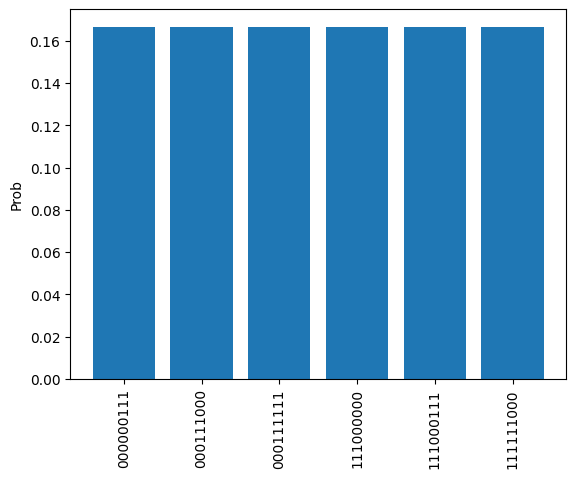

In [3]:
gridsize=3
bas=bas_dataset(grid_size=gridsize)
bas.dataset.sort()
# considering only bars dataset
wt=hebbing_learning(bas.bas_dict['bars'])

# creating ising model for the bas bars only dataset
n_spins=gridsize*gridsize
shape_of_J=(n_spins,n_spins)
J=-1*wt
h=np.zeros(n_spins)
model=IsingEnergyFunction(J,h,name=f'ising model BAS {n_spins}X{n_spins} bars only')

# model.model_summary()
beta=1.5
## run exact sampling over all possible configurations 
exact_sampled_model = Exact_Sampling(model, beta)

## get distribution from the model
bpd= DiscreteProbabilityDistribution(exact_sampled_model.boltzmann_pd)
exact_sampled_model.sampling_summary()

## EXP 4 : 
### MCMC without Phase Hamiltonan


In [4]:
experiment4_filename = 'SamplingData/BAS3/MIXINGDATA_BAS3_4.pkl'
experimentresult4_filename = 'SamplingData/BAS3/MIXINGRESULT_BAS3_4.pkl'

In [ ]:
# with open(experiment4_filename, 'rb') as f: MIXINGDATA4 = pickle.load(f)
# with open(experimentresult4_filename, 'rb') as f: MIXINGRESULT4 = pickle.load(f)
with open('SamplingData/BAS3/MIXINGRESULT_BAS3_4_gamma.pkl', 'rb') as f : MIXINGRESULT4_by_gamma = pickle.load(f)
with open('SamplingData/BAS3/MIXINGRESULT_BAS3_4_mcmc.pkl', 'rb') as f : MIXINGRESULT4_by_mcmc = pickle.load(f)

/home/pafloxy/Documents/QBMS/quMCMC/qumcmc/energy_models.py:35: RuntimeWarning: divide by zero encountered in scalar divide
  self.alpha = np.sqrt(self.num_spins) / np.sqrt( sum([J[i][j]**2 for i in range(self.num_spins) for j in range(i)]) + sum([h[j]**2 for j in range(self.num_spins)])  )


In [17]:
# MIXINGRESULT4_by_gamma = EXPERIMENTRESULTS(MIXINGRESULT4, model= exact_sampled_model, type= 'gamma',  mcmc_types= MIXINGRESULT4['e'].mcmc_types, gamma_ranges= list(MIXINGRESULT4.keys()) )
# name = 'SamplingData/BAS3/MIXINGRESULT_BAS3_4_gamma.pkl'
# with open(name, 'wb') as f: pickle.dump(MIXINGRESULT4_by_gamma, f)
# MIXINGRESULT4_by_mcmc = EXPERIMENTRESULTS(MIXINGRESULT4, model= exact_sampled_model, type= 'mcmc_type',  mcmc_types= MIXINGRESULT4['e'].mcmc_types, gamma_ranges= list(MIXINGRESULT4.keys()) )
# name = 'SamplingData/BAS3/MIXINGRESULT_BAS3_4_mcmc.pkl'
# with open(name, 'wb') as f: pickle.dump(MIXINGRESULT4_by_mcmc, f)

#### Running Experiments

In [37]:
# MIXINGDATA4 = { gamma_range : { i: {} for i in range(num_chains)  } for gamma_range in GAMMA_RANGES.keys() }

In [5]:
# num_chains = 10 ##
# steps = 3000 ##
# mcmc_settings_to_experiment = ['qu-wt1', 'qu-wt2', 'qu-wt3', 'qu-stabilizers-wt3']
# zero_model = IsingEnergyFunction(np.zeros((n_spins, n_spins)), np.zeros((n_spins))  )
# beta = 1.0 ; 

In [38]:
# for gamma_range in GAMMA_RANGES.keys():
#     for chain_no in tqdm(range(num_chains), desc= str(gamma_range)):
#         for mcmc_setting in mcmc_settings_to_experiment:

#             steps = steps ##
#             mcmc_chain = quantum_enhanced_mcmc_2(
#                 n_hops= steps,
#                 model= model,
#                 mismatched_model= [True, zero_model],
#                 temperature= 1/beta,
#                 verbose= False,
#                 name= mcmc_setting,
#                 gamma_range= GAMMA_RANGES[gamma_range] ,
#                 initial_state= bpd.get_sample(1)[0],
#                 mixer= MIXER_SETTINGS[mcmc_setting]['mixer']
#             )
            
#             MIXINGDATA4[gamma_range][chain_no][mcmc_setting] = mcmc_chain
#             with open(experiment4_filename, 'wb') as f: 
#                 pickle.dump(MIXINGDATA4 ,f)


e: 100%|██████████| 10/10 [04:56<00:00, 29.69s/it]


In [51]:
# MIXINGRESULT4 = { gamma_range : {} for gamma_range in GAMMA_RANGES.keys() } 

# for gamma_range in GAMMA_RANGES.keys():
#     MIXINGRESULT4[gamma_range] = ProcessMCMCData(MIXINGDATA4[gamma_range], exact_sampled_model, savefile_path= 'SamplingData/BAS3/', name= "MIXINGRESULT_BAS3_4")
#     MIXINGRESULT4[gamma_range].PROCESS_ALL(save_data= True)
#     with open(experimentresult4_filename, 'wb') as f: pickle.dump(MIXINGRESULT4, f)

OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.13it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.14it/s]


#### Results

##### Trajectory vis

gamma range : (0.0, 0.1)


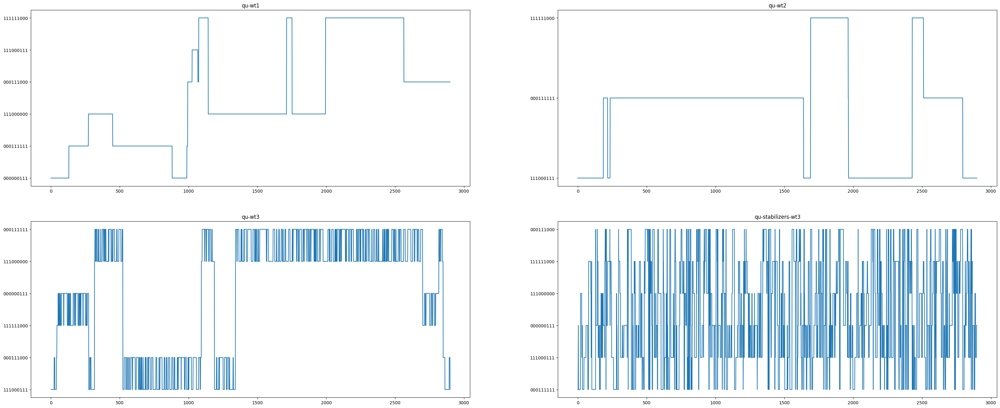

gamma range : (0.1, 0.3)


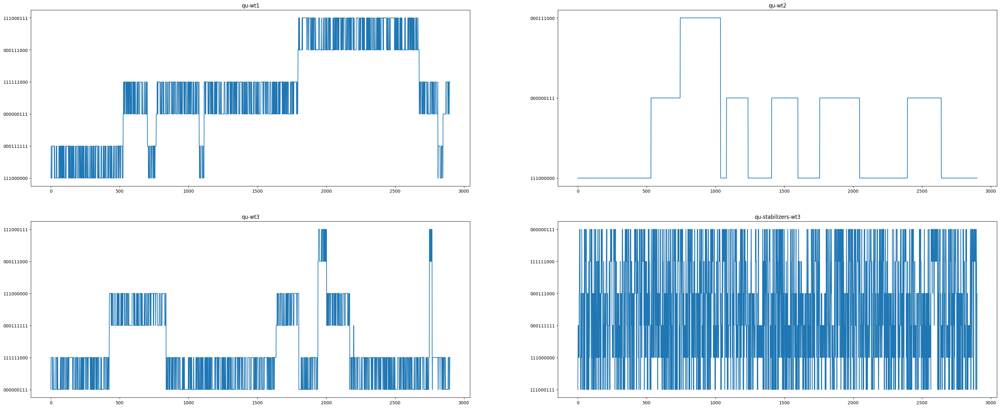

gamma range : (0.3, 0.6)


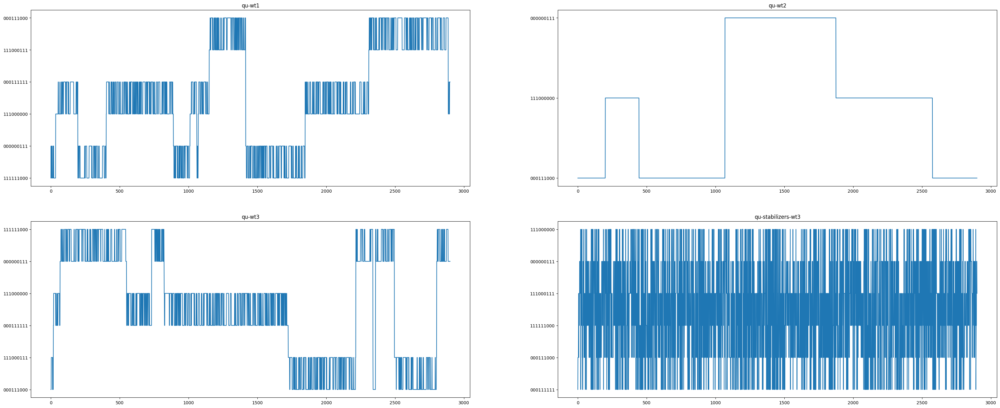

gamma range : (0.6, 0.9)


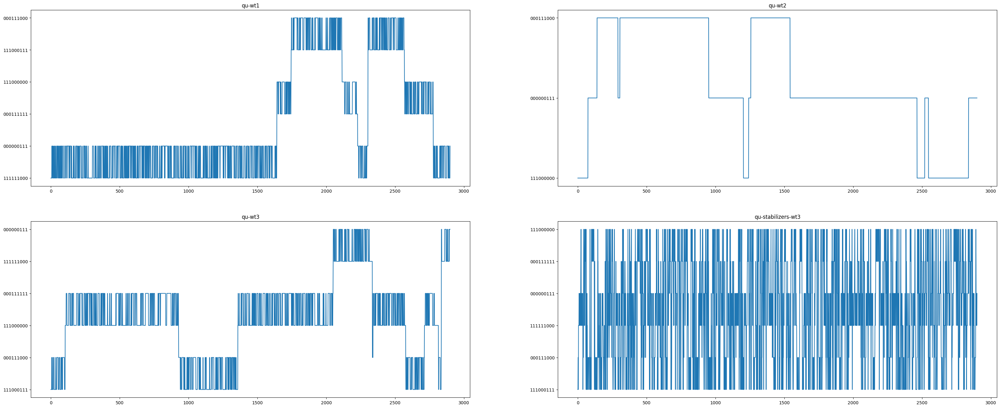

gamma range : (0.9, 1.0)


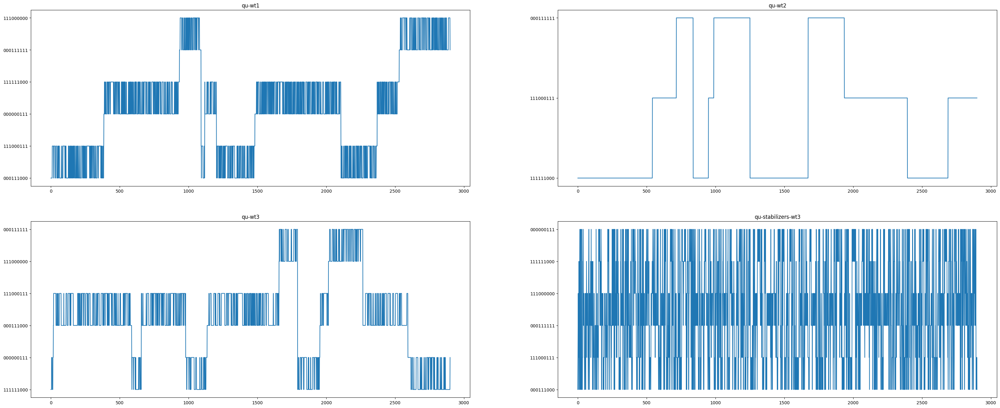

In [39]:
# plt.figure(figsize= (25,16))
for gamma_range in GAMMA_RANGES.keys():
    print('gamma range : '+ str(GAMMA_RANGES[gamma_range]))
    plot_mcmc_iterations(MIXINGDATA4[gamma_range][np.random.randint(0,num_chains)], )

##### KL Div

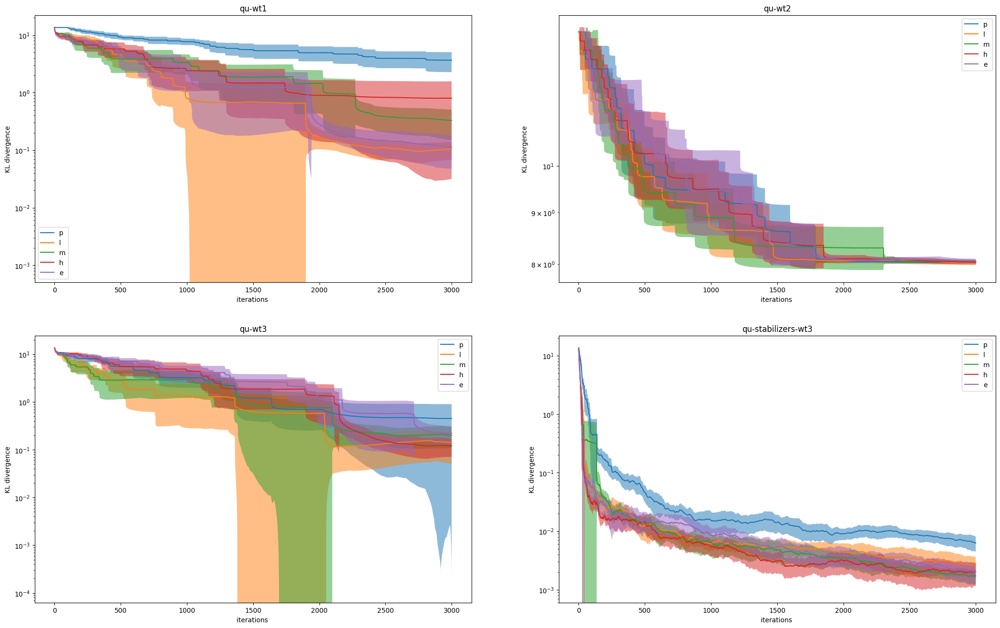

In [23]:
PLOT_KL_DIV_NEW(MIXINGRESULT4_by_gamma)

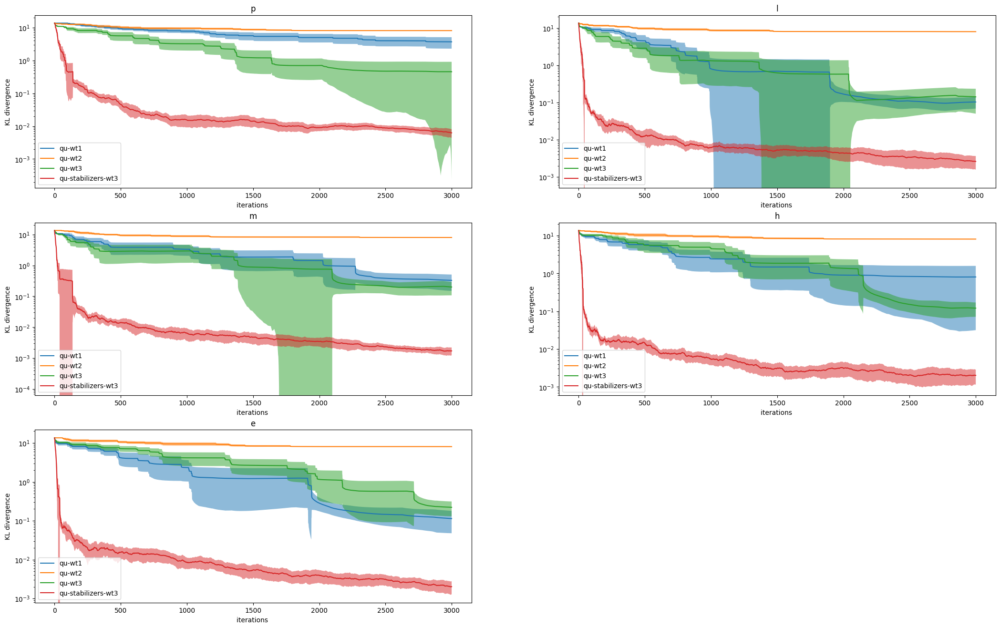

In [24]:
PLOT_KL_DIV_NEW(MIXINGRESULT4_by_mcmc)

##### Magnetisation

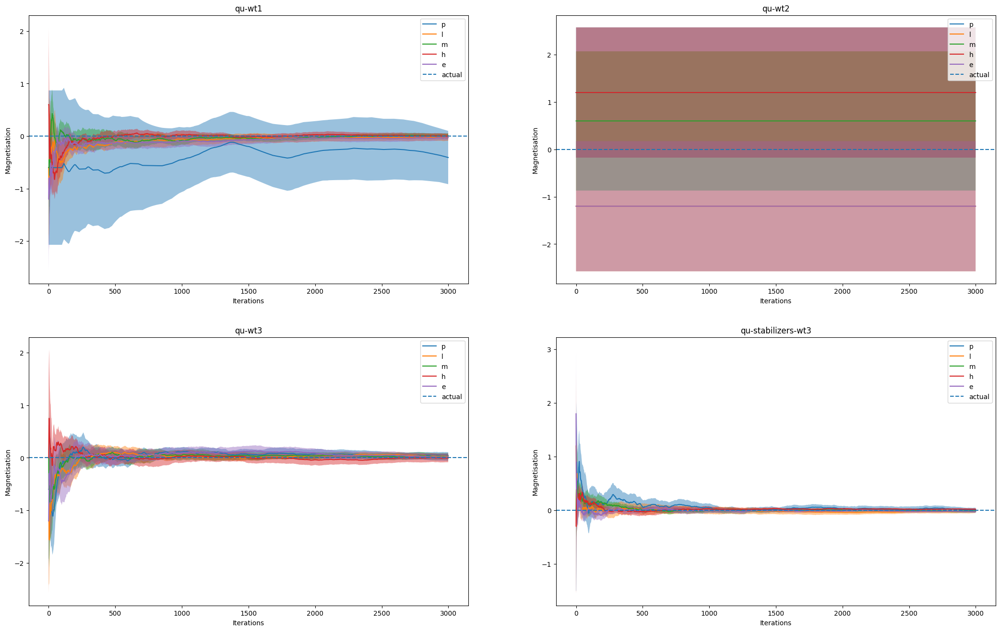

In [25]:
PLOT_MAGNETISATION_NEW(MIXINGRESULT4_by_gamma)

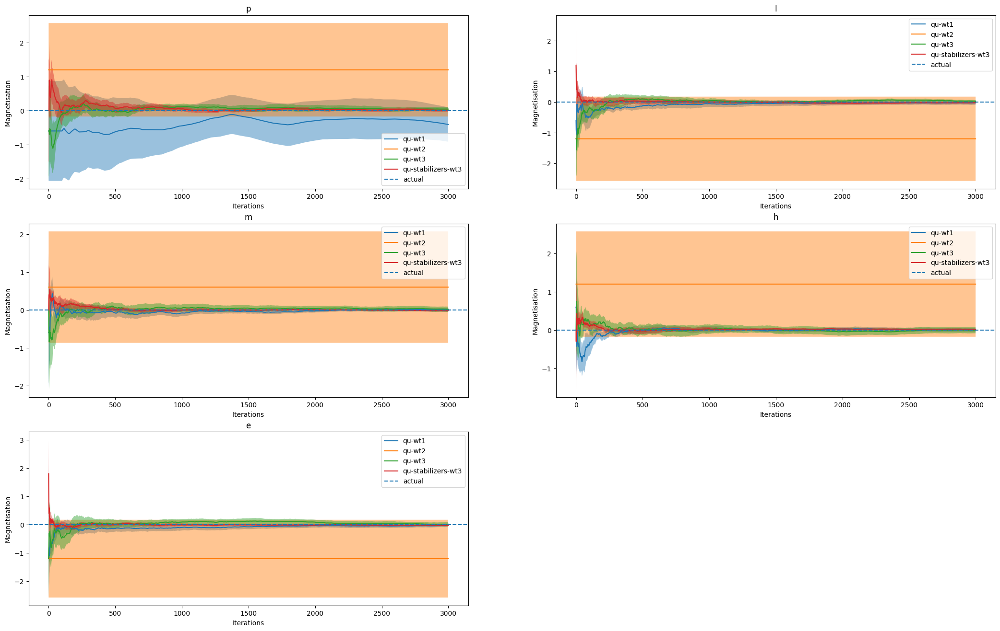

In [26]:
PLOT_MAGNETISATION_NEW(MIXINGRESULT4_by_mcmc)

##### Proposition Analysis

Type : qu-wt1


100%|██████████| 10/10 [00:01<00:00,  5.70it/s]


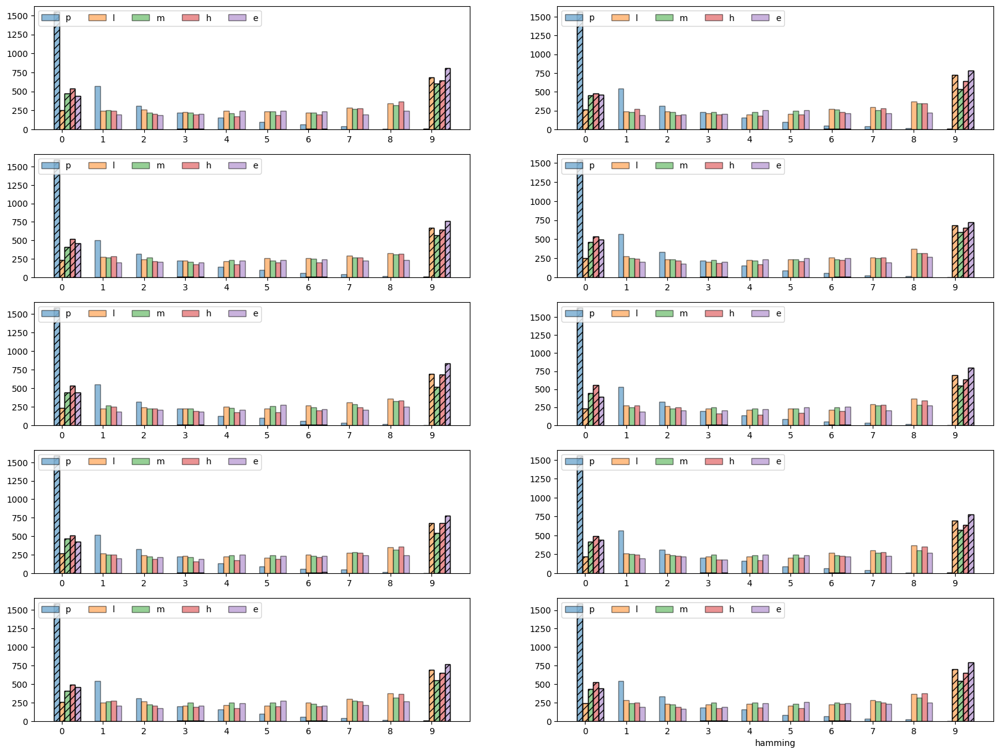

Type : qu-wt2


100%|██████████| 10/10 [00:01<00:00,  7.12it/s]


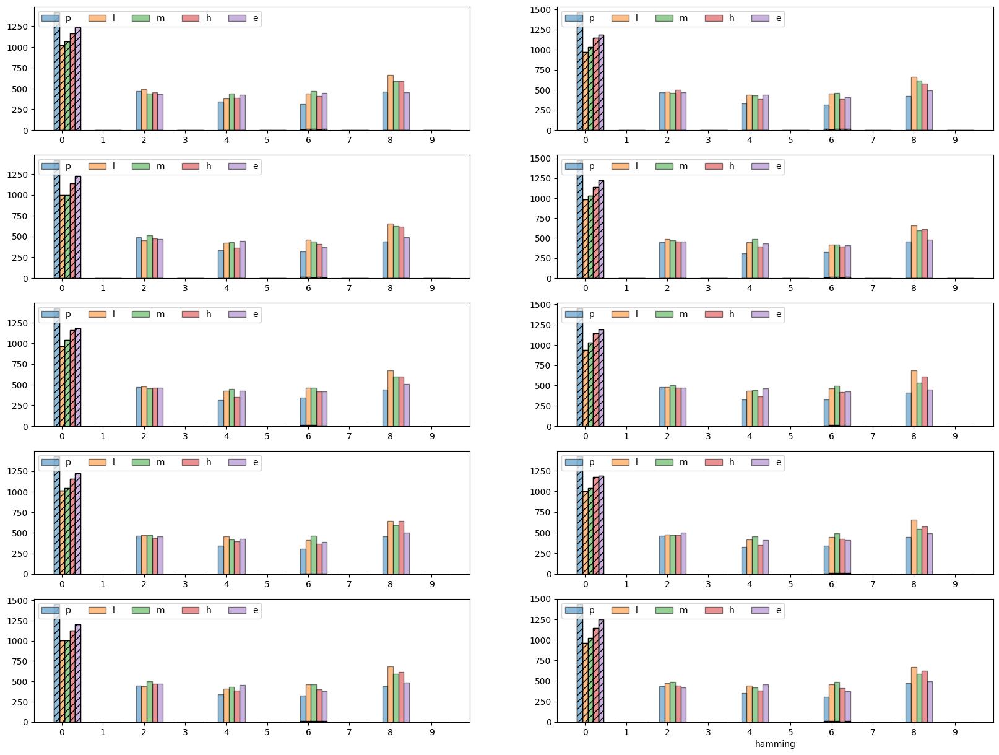

Type : qu-wt3


100%|██████████| 10/10 [00:01<00:00,  7.48it/s]


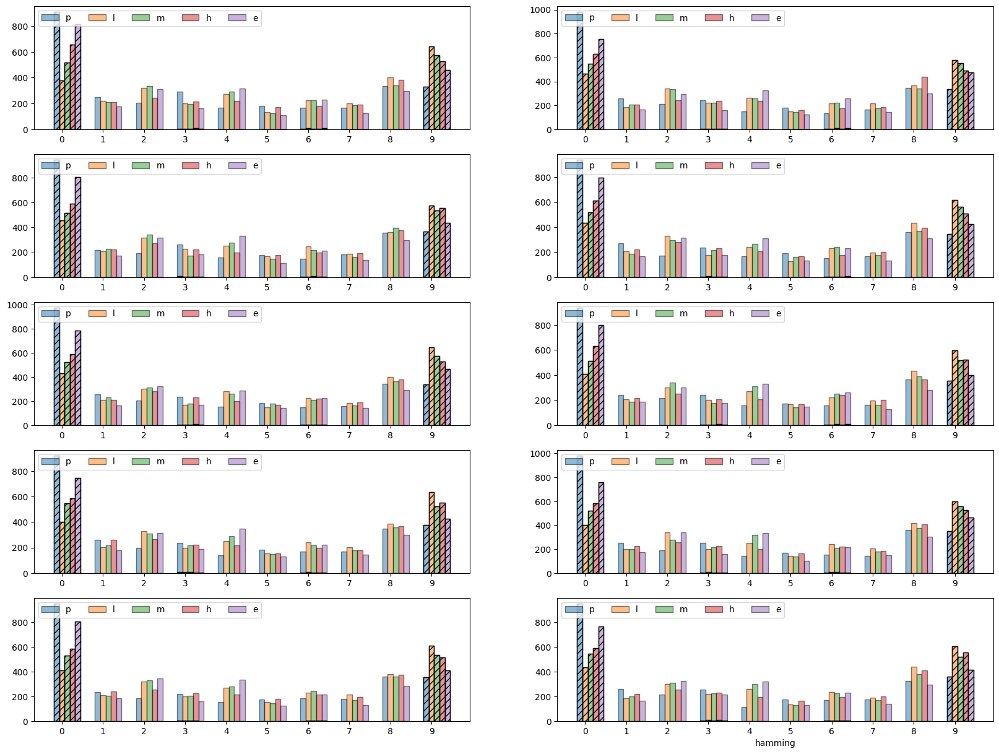

Type : qu-stabilizers-wt3


100%|██████████| 10/10 [00:03<00:00,  3.25it/s]


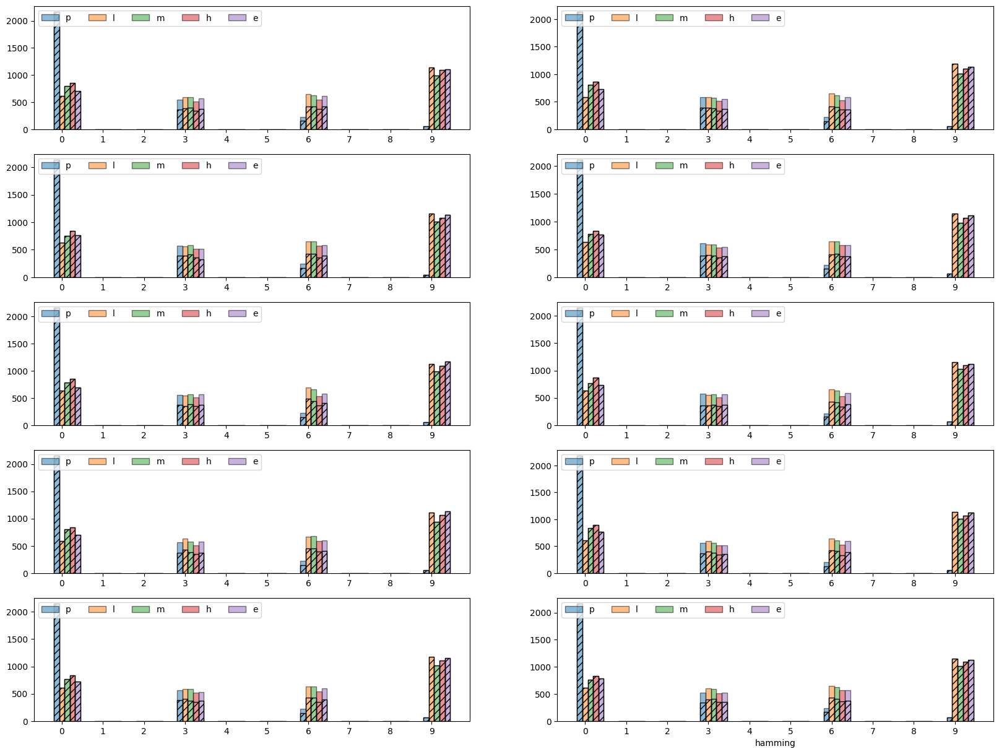

In [38]:
PLOT_MCMC_STATISTICS_HAMMING(MIXINGRESULT4_by_gamma, (26,16))

Type : p


100%|██████████| 10/10 [00:01<00:00,  7.95it/s]


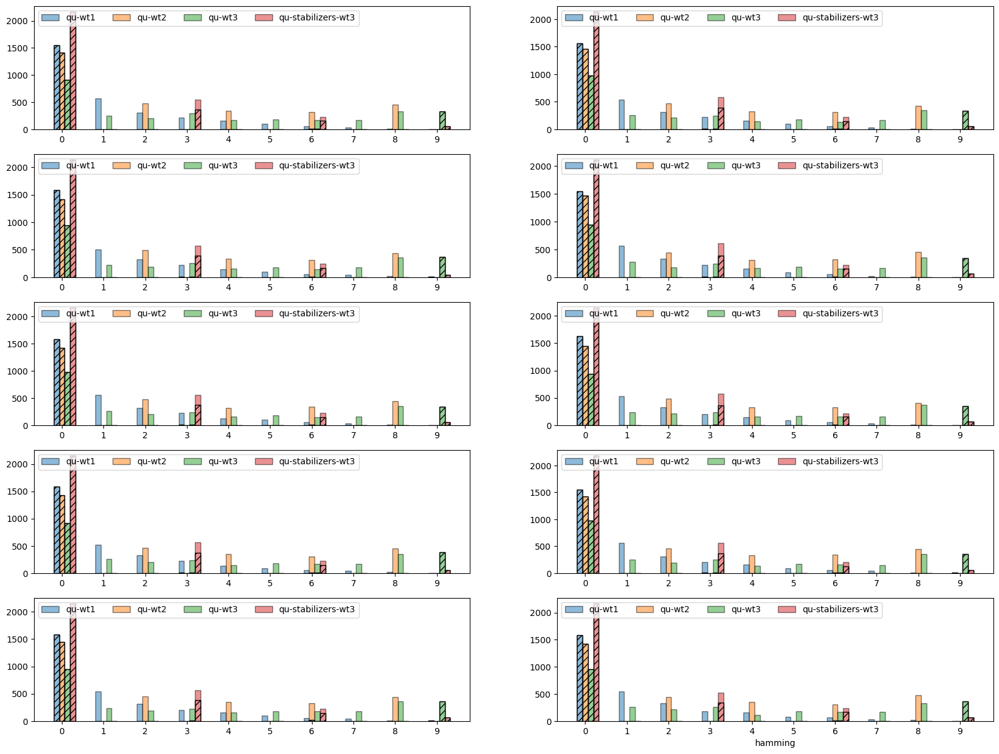

Type : l


100%|██████████| 10/10 [00:01<00:00,  8.21it/s]


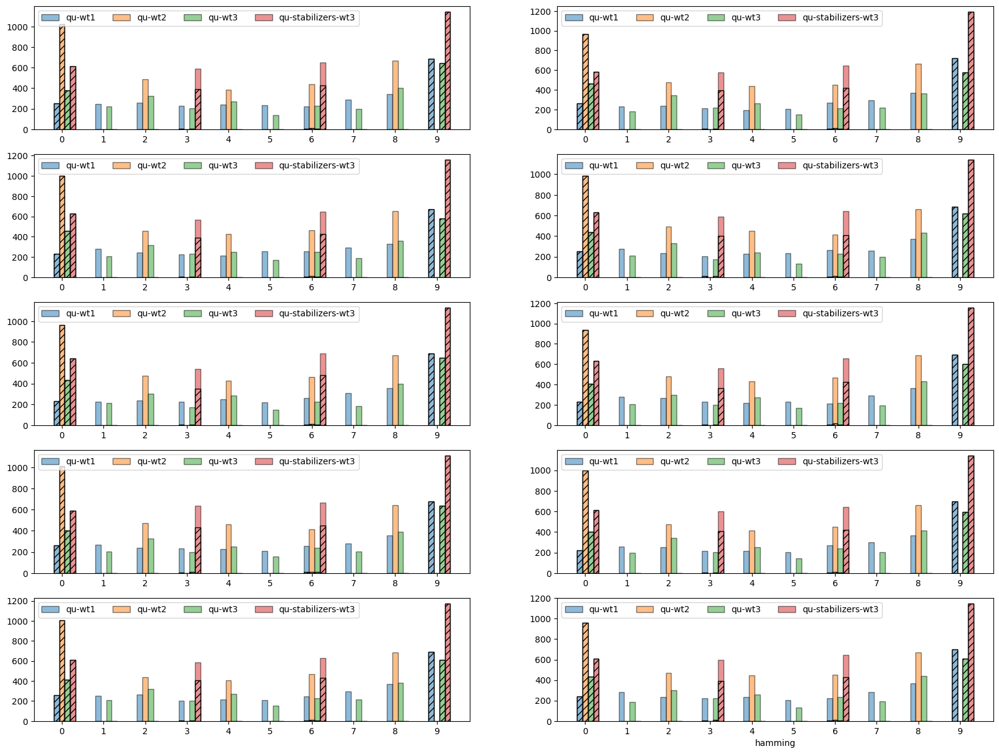

Type : m


100%|██████████| 10/10 [00:01<00:00,  8.39it/s]


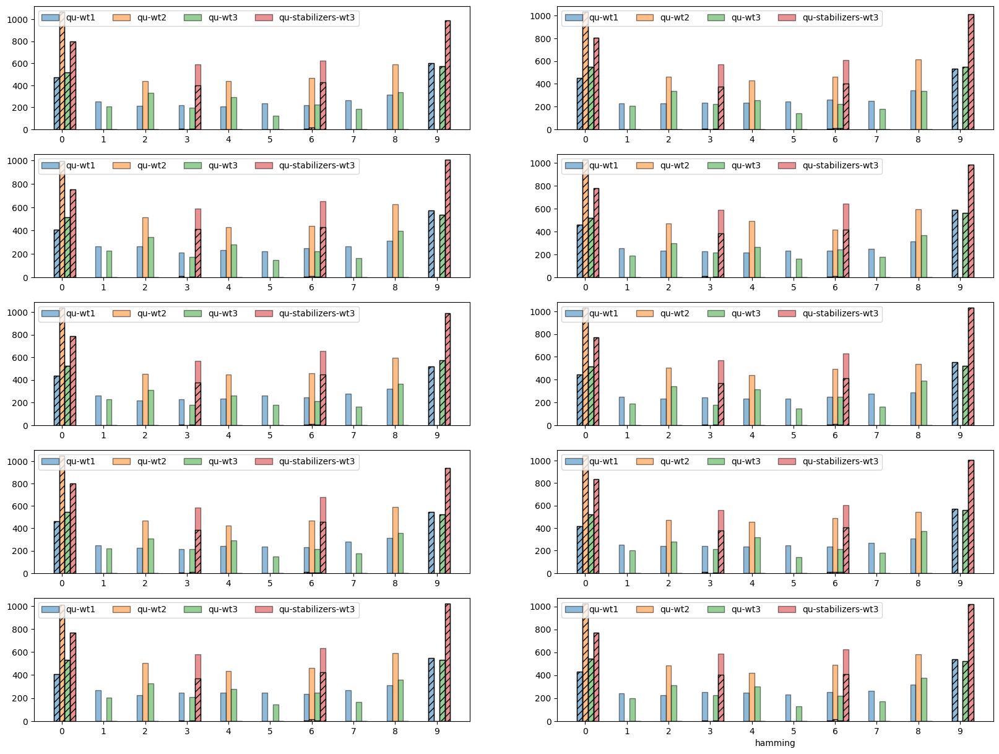

Type : h


100%|██████████| 10/10 [00:01<00:00,  7.87it/s]


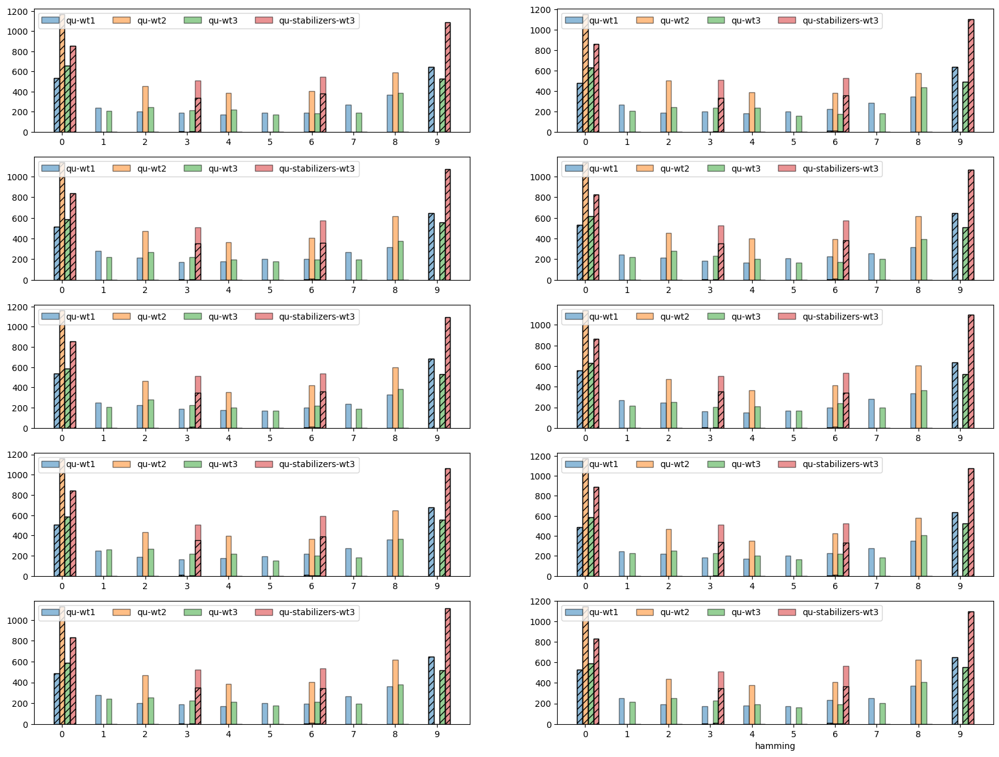

Type : e


100%|██████████| 10/10 [00:01<00:00,  7.80it/s]


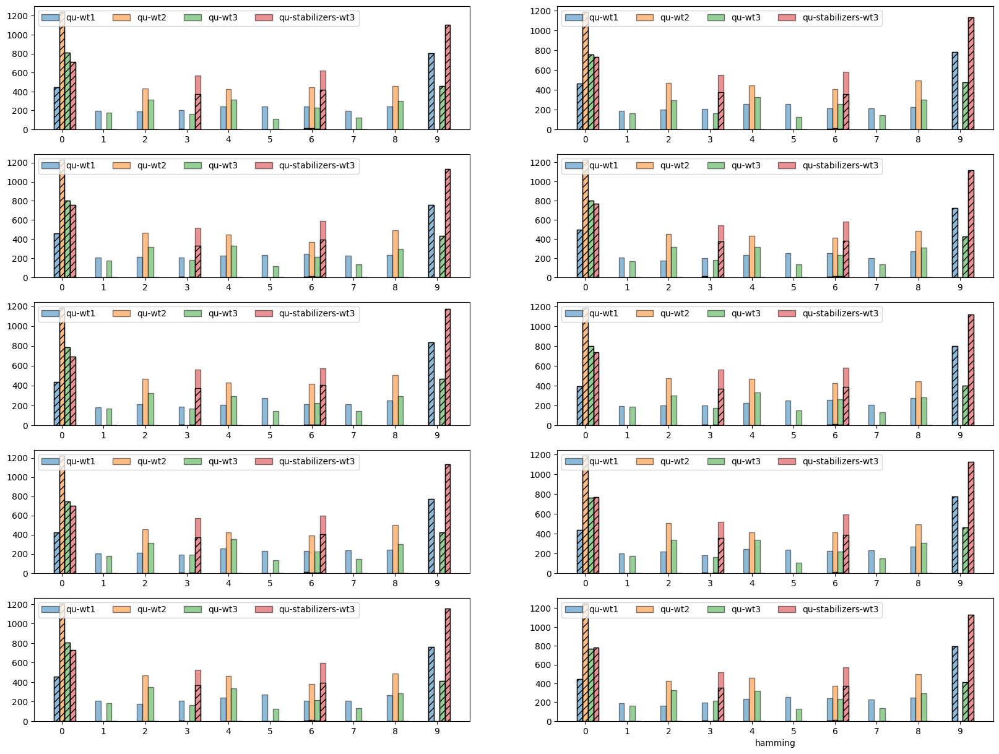

In [39]:
PLOT_MCMC_STATISTICS_HAMMING(MIXINGRESULT4_by_mcmc, (26,16))

## EXP 3
### Regular MCMC


In [19]:
experiment3_filename = 'SamplingData/BAS3/MIXINGDATA_BAS3_3.pkl'
experimentresult3_filename = 'SamplingData/BAS3/MIXINGRESULT_BAS3_3.pkl'

In [20]:
with open(experiment3_filename, 'rb') as f: MIXINGDATA3 = pickle.load(f)
with open(experimentresult3_filename, 'rb') as f: MIXINGRESULT3 = pickle.load(f)
with open('SamplingData/BAS3/MIXINGRESULT_BAS3_3_gamma.pkl' ,'rb') as f:MIXINGRESULT3_by_gamma = pickle.load(f)
with open('SamplingData/BAS3/MIXINGRESULT_BAS3_3_mcmc.pkl' ,'rb') as f:MIXINGRESULT3_by_mcmc = pickle.load(f)

In [22]:
# MIXINGRESULT3_by_gamma = EXPERIMENTRESULTS(MIXINGRESULT3, model= exact_sampled_model, type= 'gamma',  mcmc_types= MIXINGRESULT3['e'].mcmc_types, gamma_ranges= list(MIXINGRESULT3.keys()) )
# name = 'SamplingData/BAS3/MIXINGRESULT_BAS3_3_gamma.pkl'
# with open(name, 'wb') as f: pickle.dump(MIXINGRESULT3_by_gamma, f)
# MIXINGRESULT3_by_mcmc = EXPERIMENTRESULTS(MIXINGRESULT3, model= exact_sampled_model, type= 'mcmc_type',  mcmc_types= MIXINGRESULT3['e'].mcmc_types, gamma_ranges= list(MIXINGRESULT3.keys()) )
# name = 'SamplingData/BAS3/MIXINGRESULT_BAS3_3_mcmc.pkl'
# with open(name, 'wb') as f: pickle.dump(MIXINGRESULT3_by_mcmc, f)

#### Running Experiments

In [16]:
num_chains = 10 ; steps = 3000 ; beta = 1.0
mcmc_settings_to_experiment = ['qu-wt1', 'qu-wt2', 'qu-wt3', 'qu-stabilizers-wt3']

In [47]:
# MIXINGDATA3 = { gamma_range : { i: {} for i in range(num_chains)  } for gamma_range in GAMMA_RANGES.keys() }

In [48]:
# for gamma_range in GAMMA_RANGES.keys():
#     for chain_no in tqdm(range(num_chains), desc= 'GAMMA RANGE: ' +str(gamma_range)):
#         for mcmc_setting in mcmc_settings_to_experiment:

#             steps = 3000
#             mcmc_chain = quantum_enhanced_mcmc_2(
#                 n_hops= steps,
#                 model= model,
#                 temperature= 1/beta,
#                 verbose= False,
#                 name= mcmc_setting,
#                 gamma_range= GAMMA_RANGES[gamma_range],
#                 initial_state= bpd.get_sample(1)[0],
#                 mixer= MIXER_SETTINGS[mcmc_setting]['mixer']
#             )
            
#             MIXINGDATA3[gamma_range][chain_no][mcmc_setting] = mcmc_chain
#             with open(experiment3_filename, 'wb') as f: pickle.dump(MIXINGDATA3, f)

GAMMA RANGE: e: 100%|██████████| 10/10 [11:27<00:00, 68.79s/it]


In [22]:
# MIXINGRESULT3 = { gamma_range : {} for gamma_range in GAMMA_RANGES.keys() } 
# for gamma_range in GAMMA_RANGES.keys():
#     MIXINGRESULT3[gamma_range] = ProcessMCMCData(MIXINGDATA3[gamma_range], exact_sampled_model, savefile_path= 'SamplingData/BAS3/', name= "MIXINGRESULT_BAS3_3")
#     MIXINGRESULT3[gamma_range].PROCESS_ALL(save_data= True)
#     with open(experimentresult3_filename, 'wb') as f: pickle.dump(MIXINGRESULT3, f)

OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.17it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.19it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.16it/s]


OUTPUT DIRECTORY:  /home/pafloxy/Documents/QBMS/quMCMC/SamplingData/BAS3/


Processing MCMC Statistics: 100%|██████████| 10/10 [00:04<00:00,  2.28it/s]


#### Results

##### Trajectory Viz

gamma range : (0.0, 0.1)


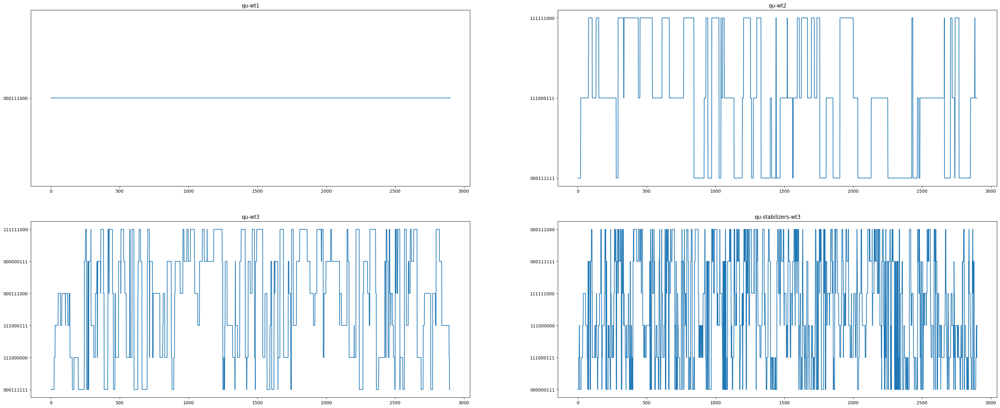

gamma range : (0.1, 0.3)


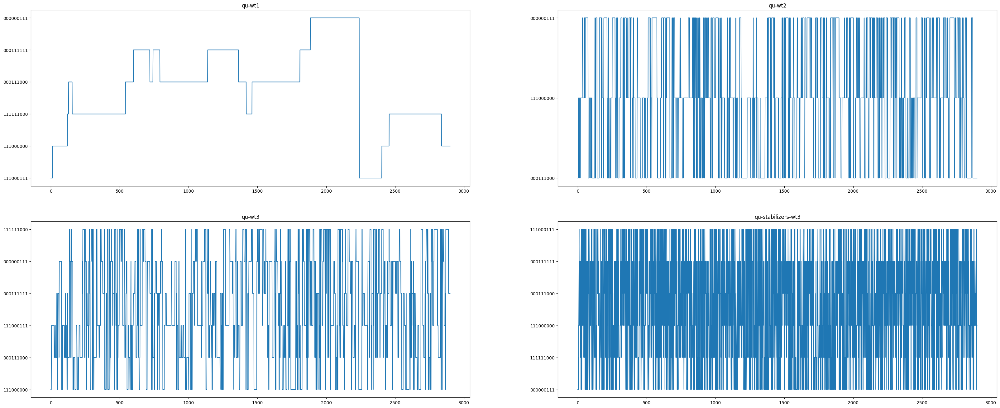

gamma range : (0.3, 0.6)


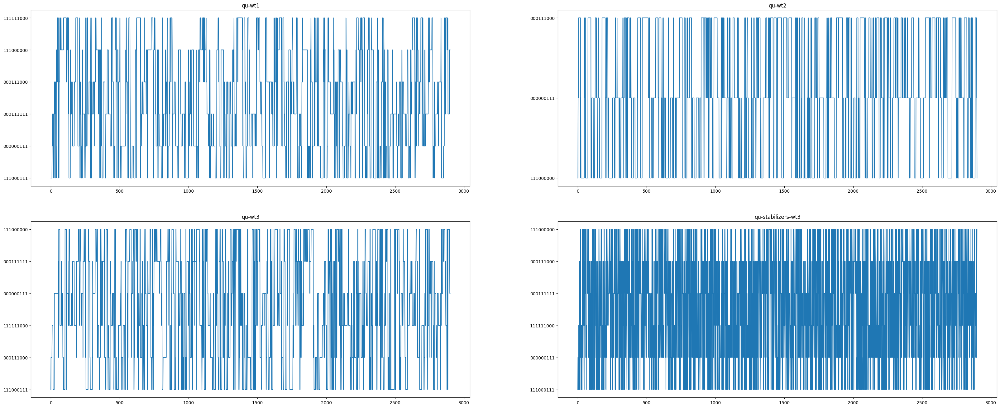

gamma range : (0.6, 0.9)


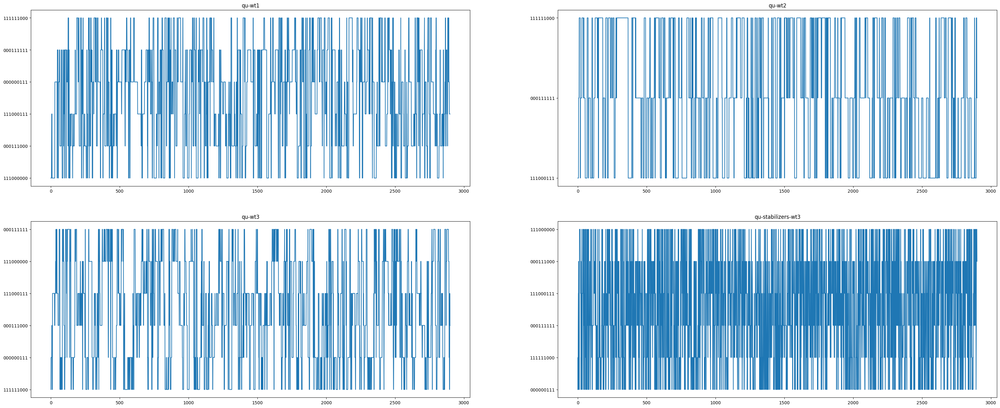

gamma range : (0.9, 1.0)


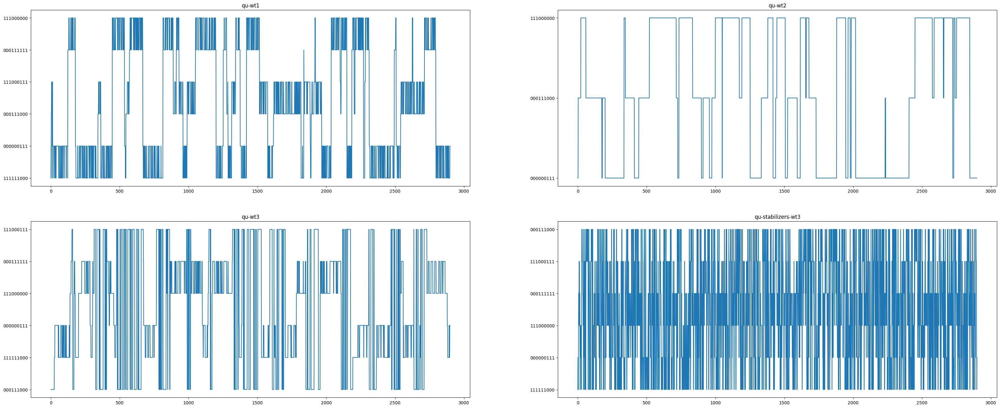

In [17]:
for gamma_range in GAMMA_RANGES.keys():
    print('gamma range : '+ str(GAMMA_RANGES[gamma_range]))
    plot_mcmc_iterations(MIXINGDATA3[gamma_range][np.random.randint(0,num_chains)], )

##### KL Div

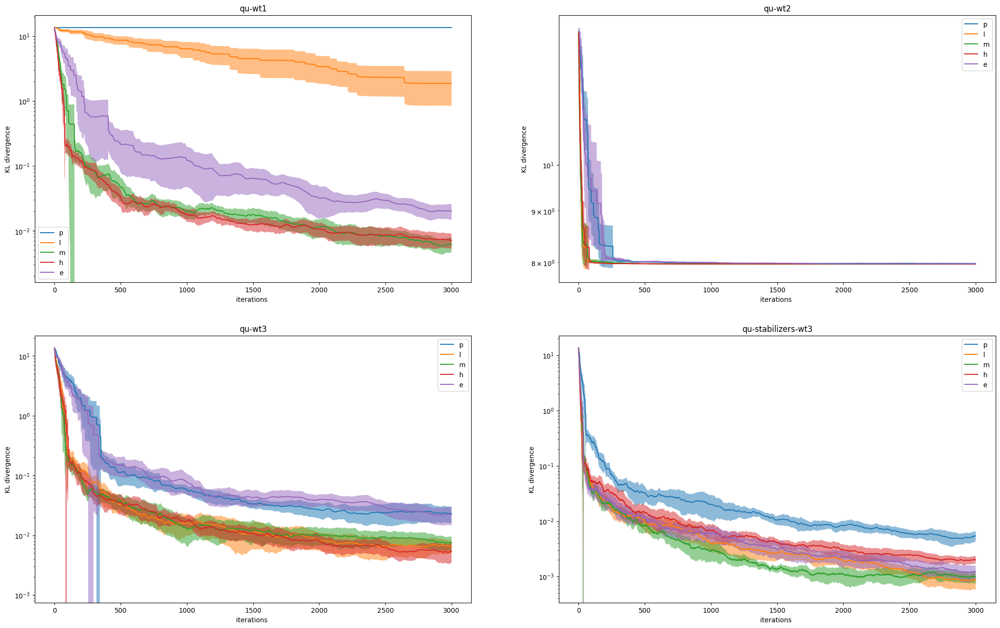

In [30]:
PLOT_KL_DIV_NEW(MIXINGRESULT3_by_gamma)

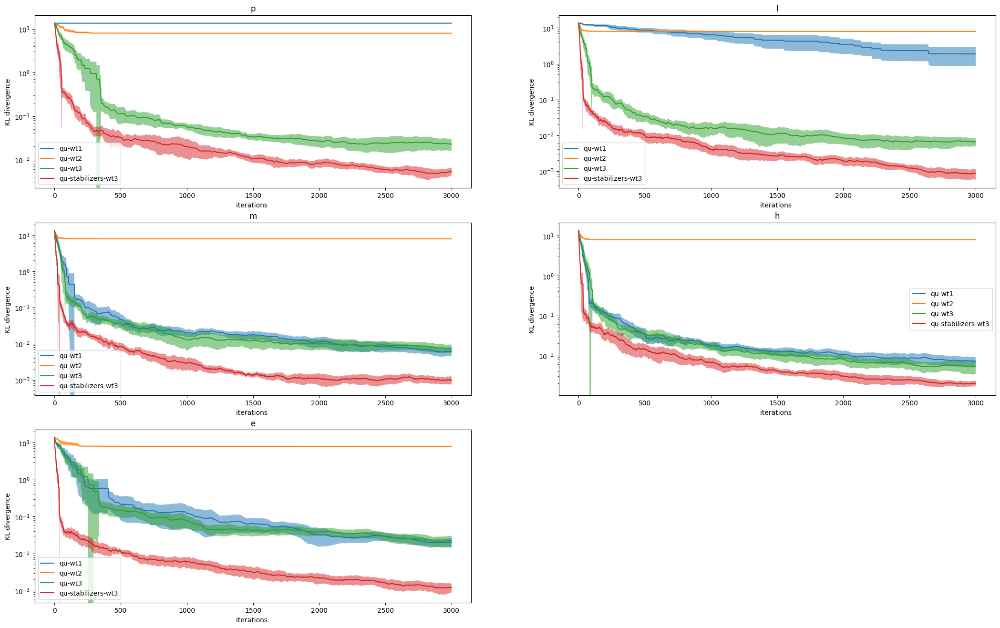

In [31]:
PLOT_KL_DIV_NEW(MIXINGRESULT3_by_mcmc)

##### Magnetisation

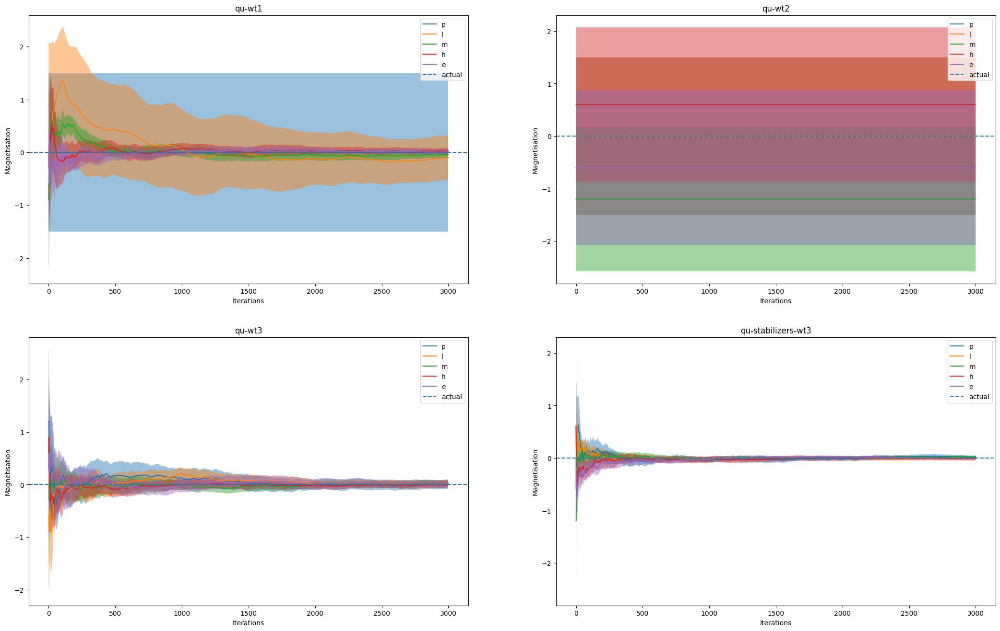

In [32]:
PLOT_MAGNETISATION_NEW(MIXINGRESULT3_by_gamma)

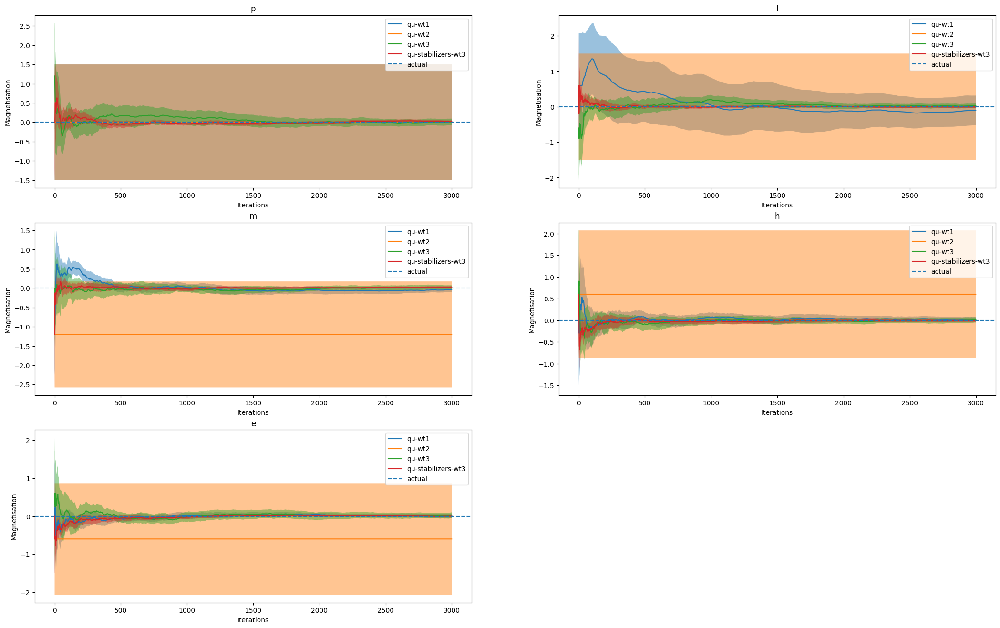

In [33]:
PLOT_MAGNETISATION_NEW(MIXINGRESULT3_by_mcmc)

##### Proposition Analytics

Type : qu-wt1


100%|██████████| 10/10 [00:01<00:00,  6.74it/s]


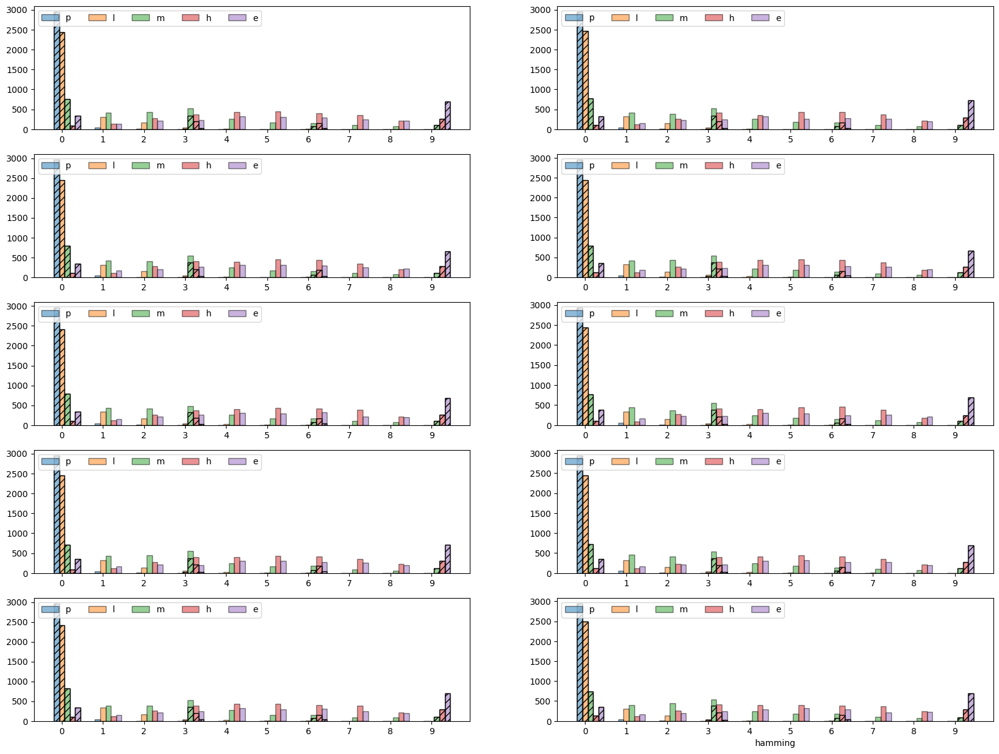

Type : qu-wt2


100%|██████████| 10/10 [00:01<00:00,  6.63it/s]


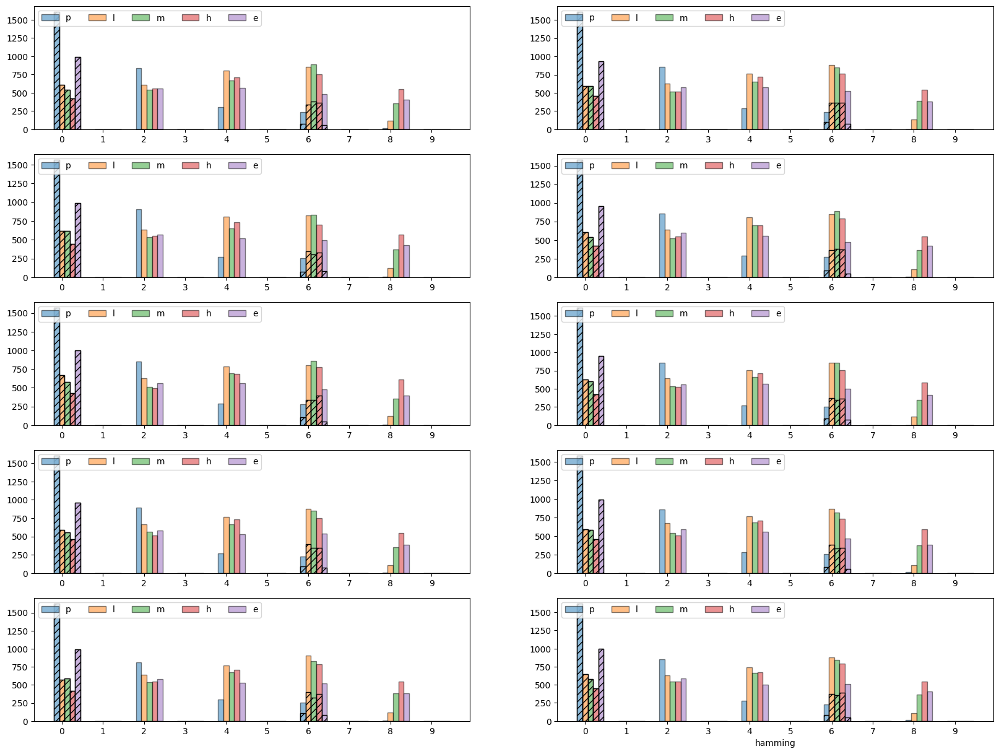

Type : qu-wt3


100%|██████████| 10/10 [00:01<00:00,  6.59it/s]


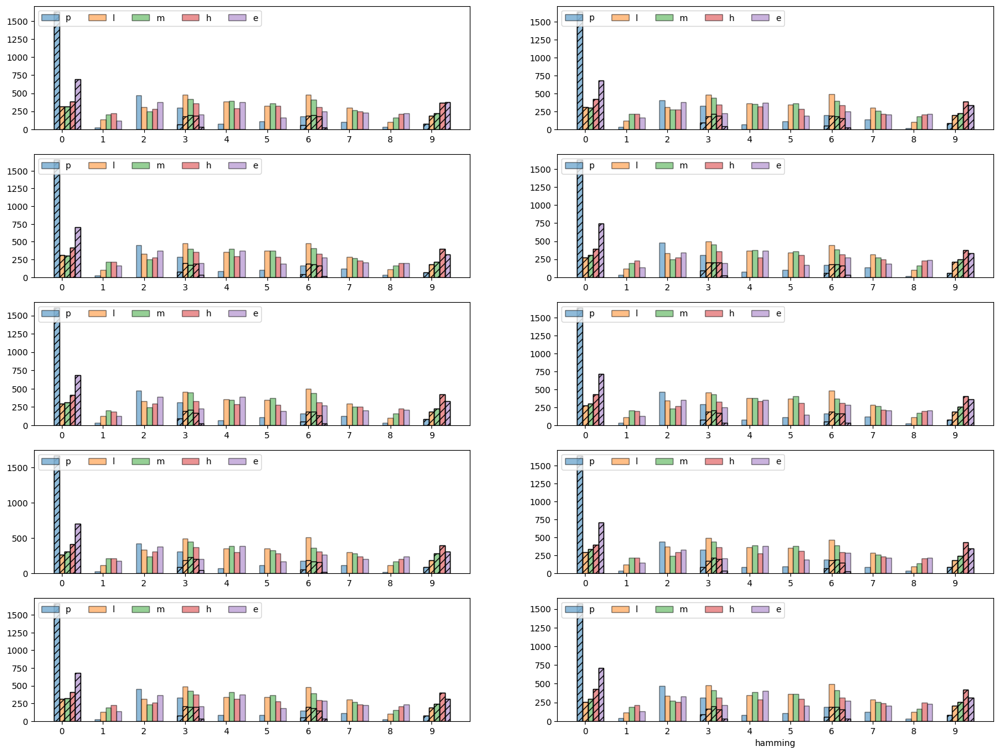

Type : qu-stabilizers-wt3


100%|██████████| 10/10 [00:01<00:00,  6.47it/s]


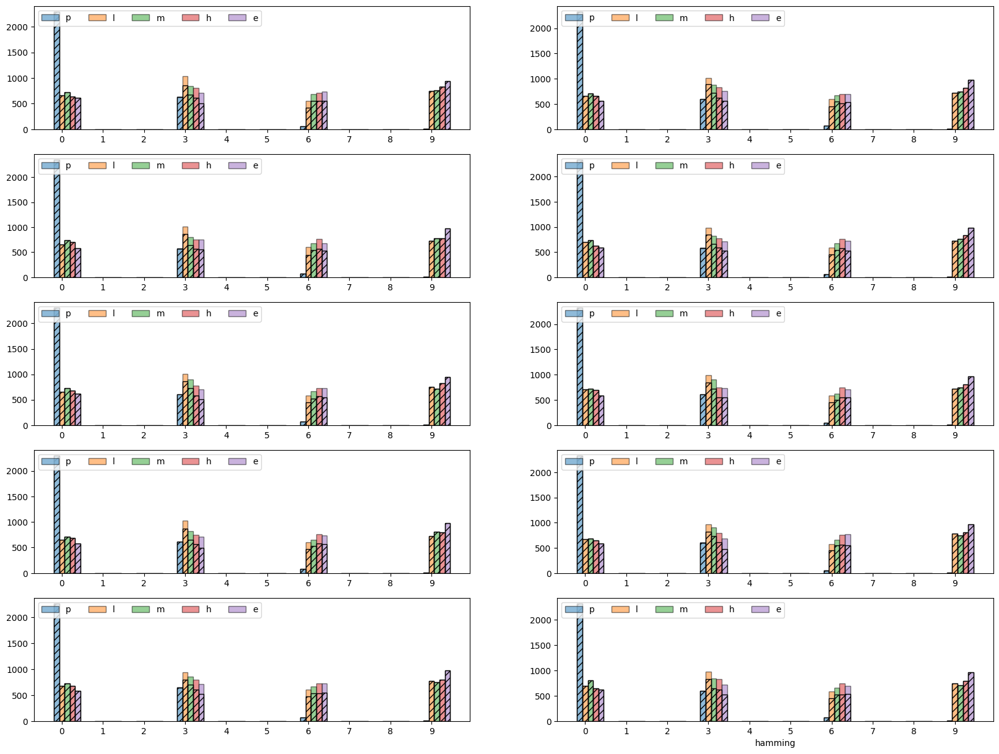

In [35]:
PLOT_MCMC_STATISTICS_HAMMING(MIXINGRESULT3_by_gamma, (26,16))

Type : p


100%|██████████| 10/10 [00:03<00:00,  3.30it/s]


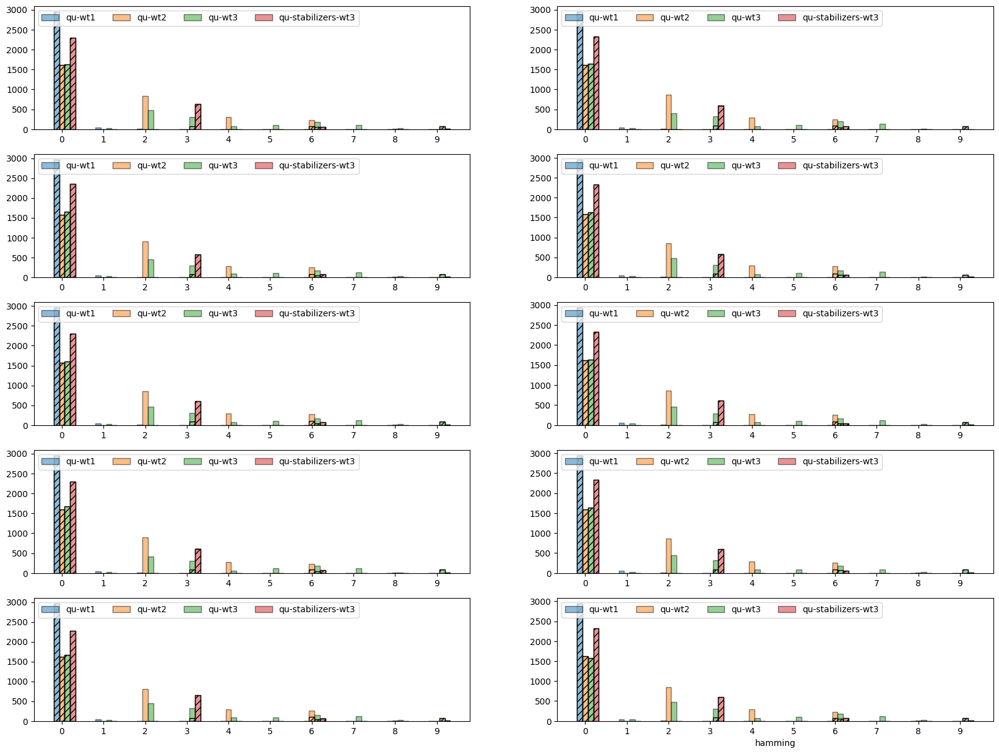

Type : l


100%|██████████| 10/10 [00:01<00:00,  7.60it/s]


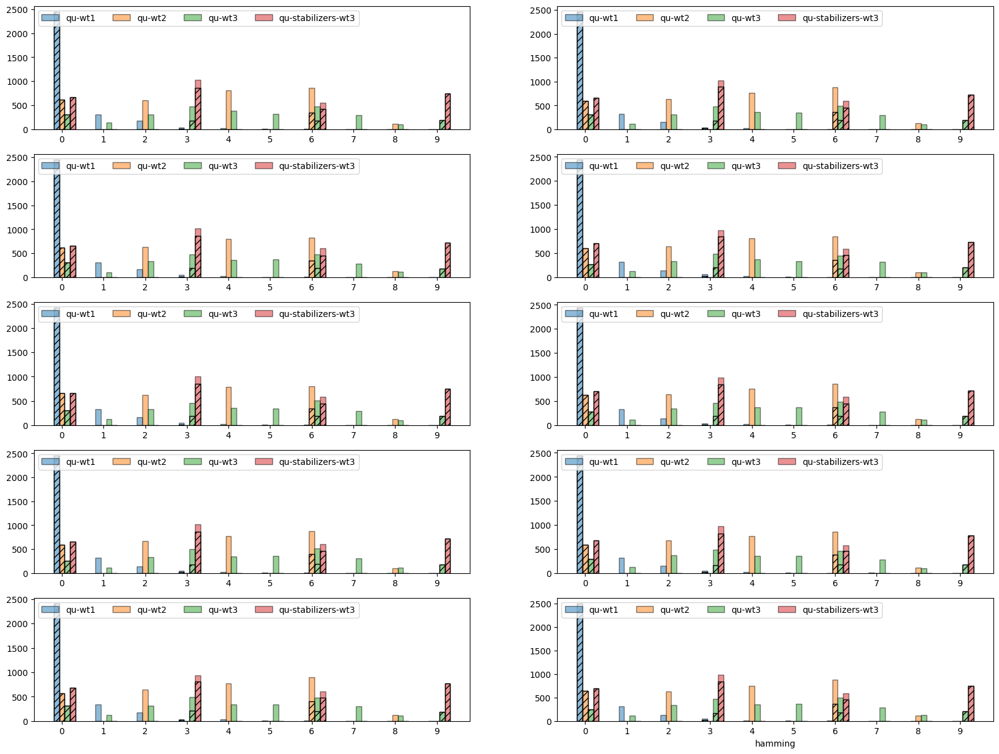

Type : m


100%|██████████| 10/10 [00:01<00:00,  8.33it/s]


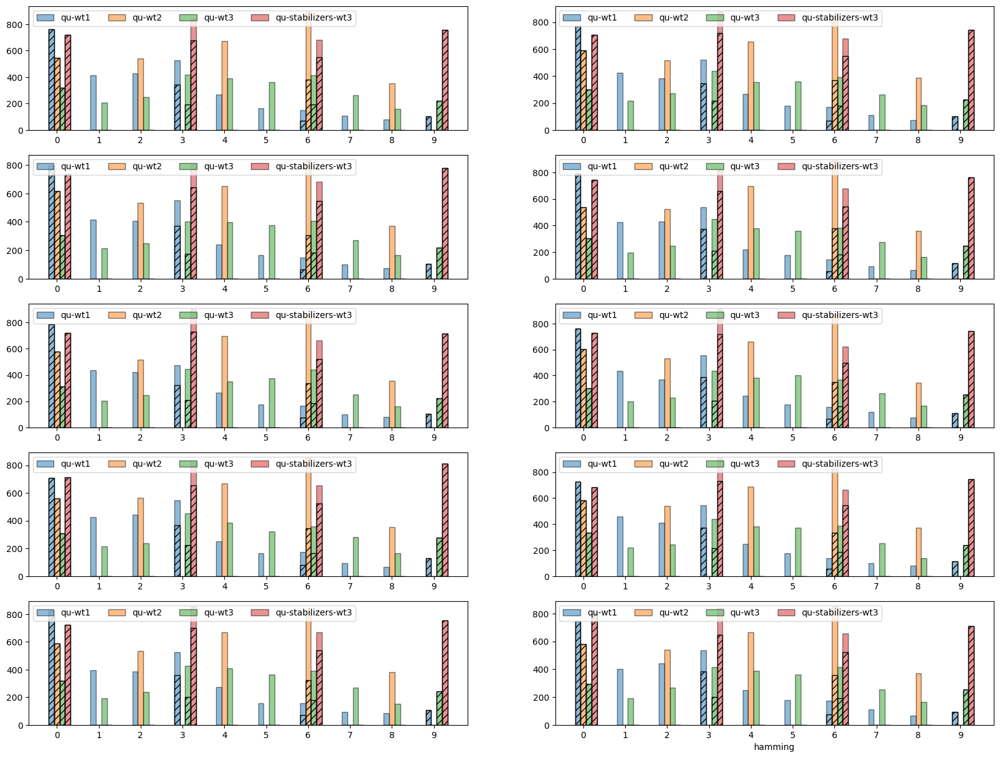

Type : h


100%|██████████| 10/10 [00:01<00:00,  7.04it/s]


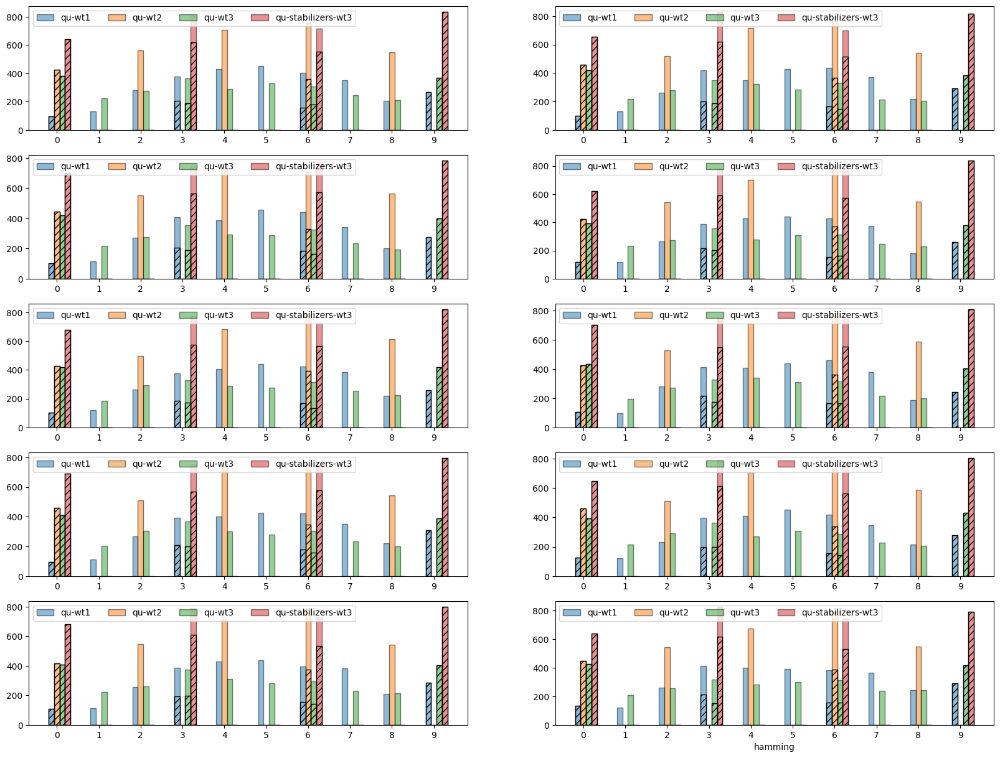

Type : e


100%|██████████| 10/10 [00:01<00:00,  7.61it/s]


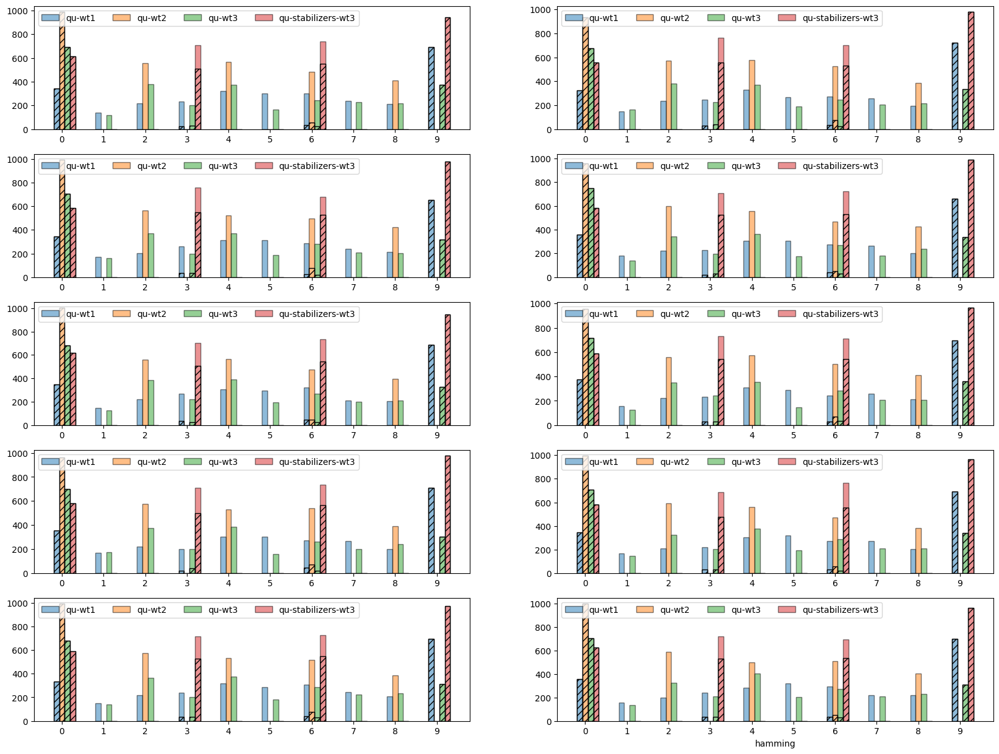

In [37]:
PLOT_MCMC_STATISTICS_HAMMING(MIXINGRESULT3_by_mcmc, (26,13))

## Cross Comparisons

In [ ]:
name = 'SamplingData/BAS3/MIXINGRESULT_BAS3_3_gamma.pkl'

### 1. GAMMA BASED Comparisons

#### KL Div

In [ ]:
tri.exp_result['qu-stabilizers-wt3']['']

Type : p


100%|██████████| 10/10 [00:01<00:00,  7.71it/s]


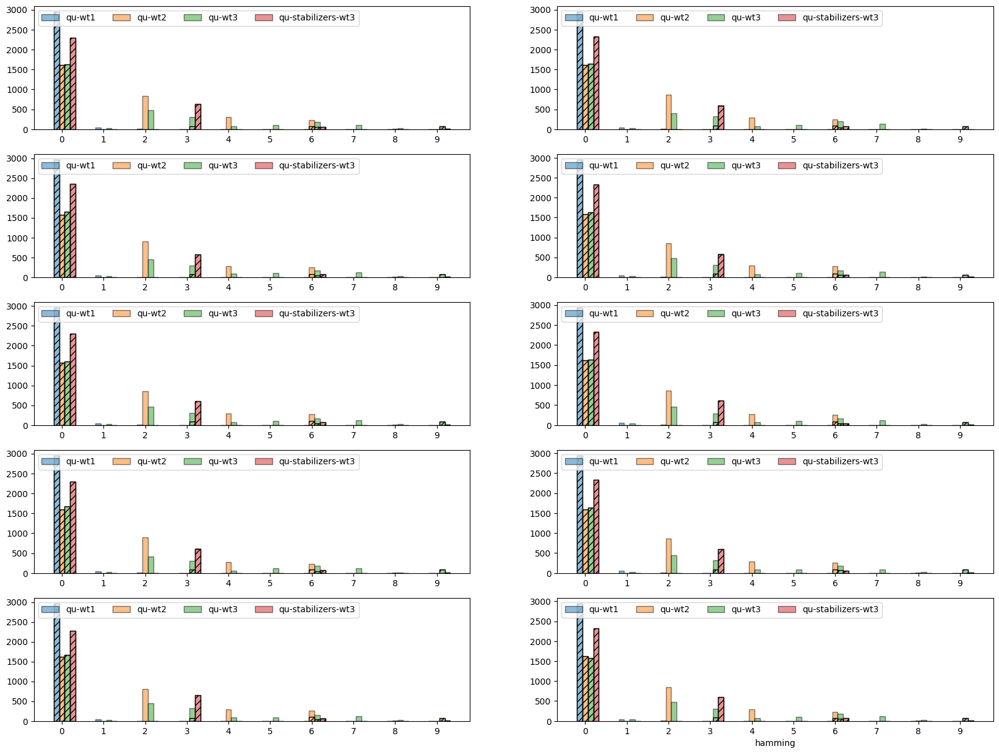

Type : l


100%|██████████| 10/10 [00:01<00:00,  7.75it/s]


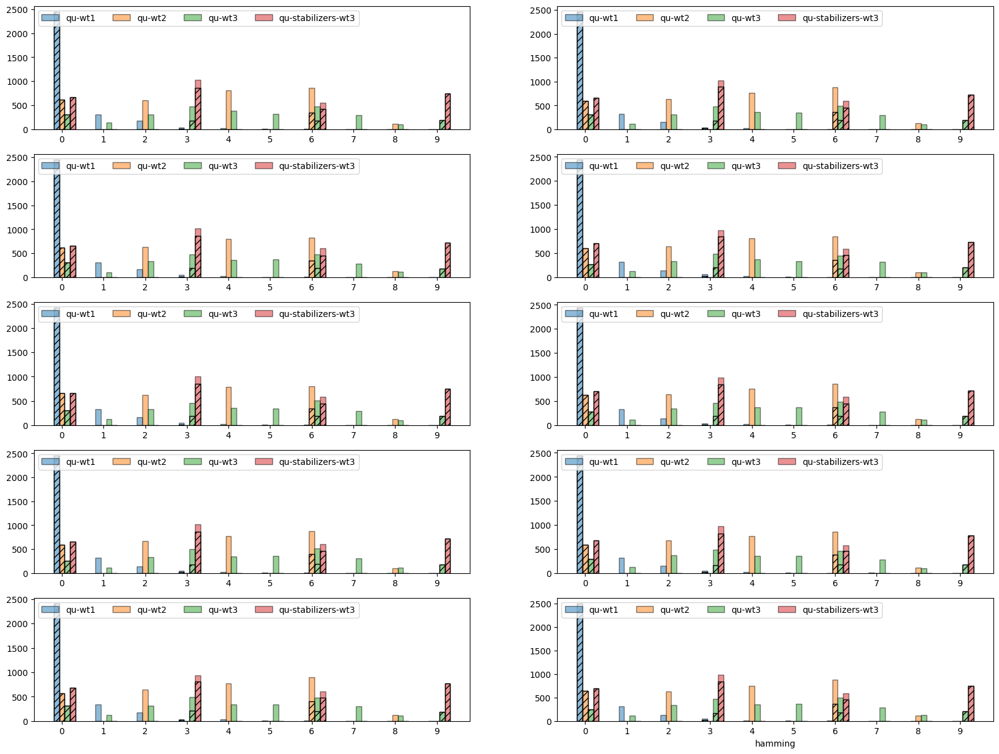

Type : m


100%|██████████| 10/10 [00:01<00:00,  8.76it/s]


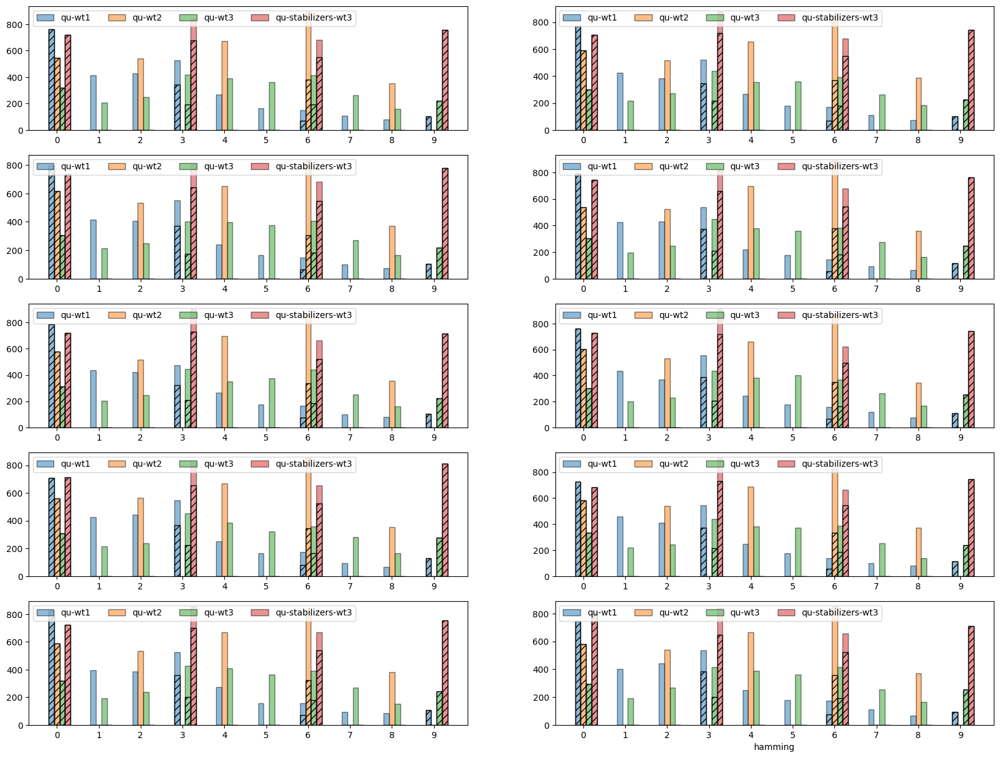

Type : h


100%|██████████| 10/10 [00:01<00:00,  8.19it/s]


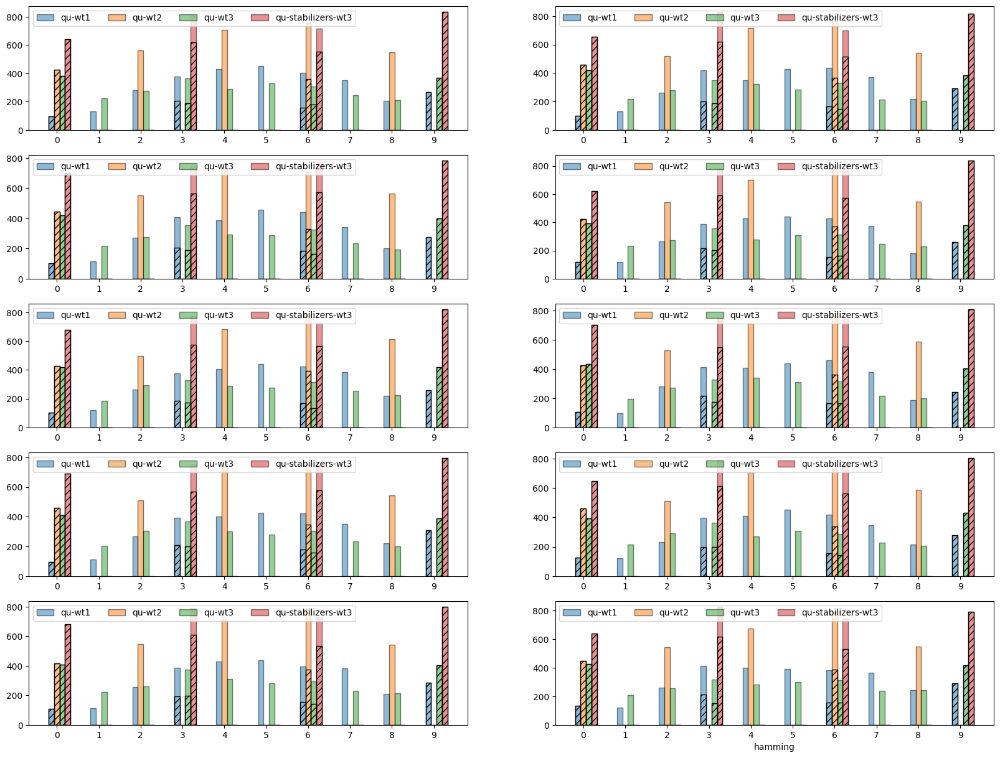

Type : e


100%|██████████| 10/10 [00:02<00:00,  3.70it/s]


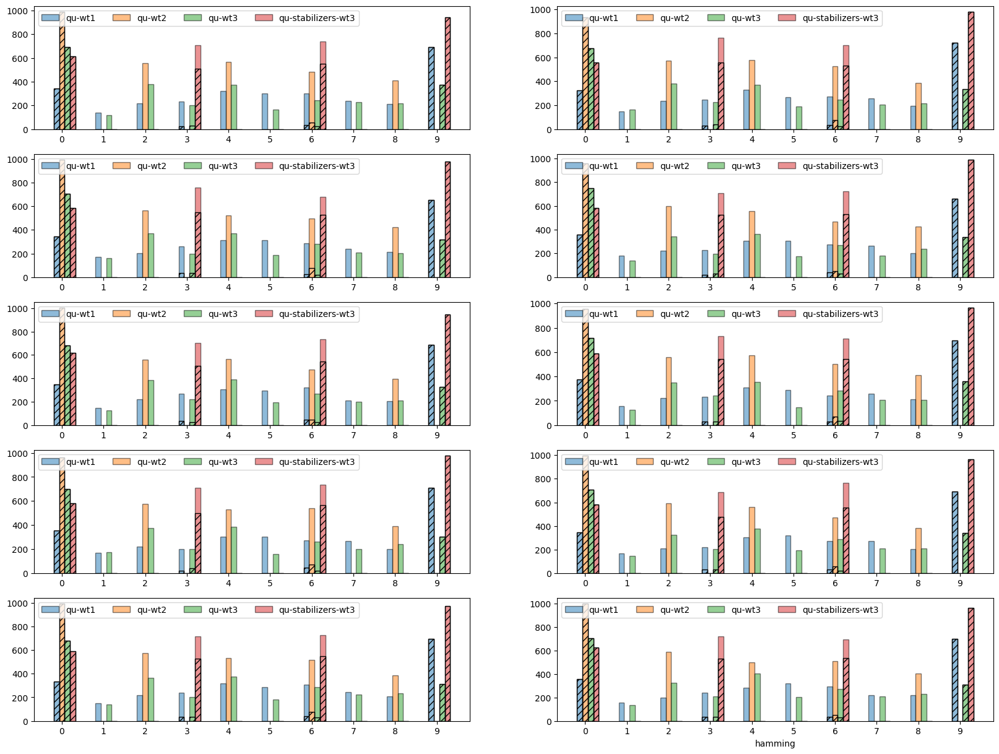

In [209]:
PLOT_MCMC_STATISTICS_HAMMING(tri2, figsize= (20,15))

Type : qu-wt1


100%|██████████| 10/10 [00:01<00:00,  5.71it/s]


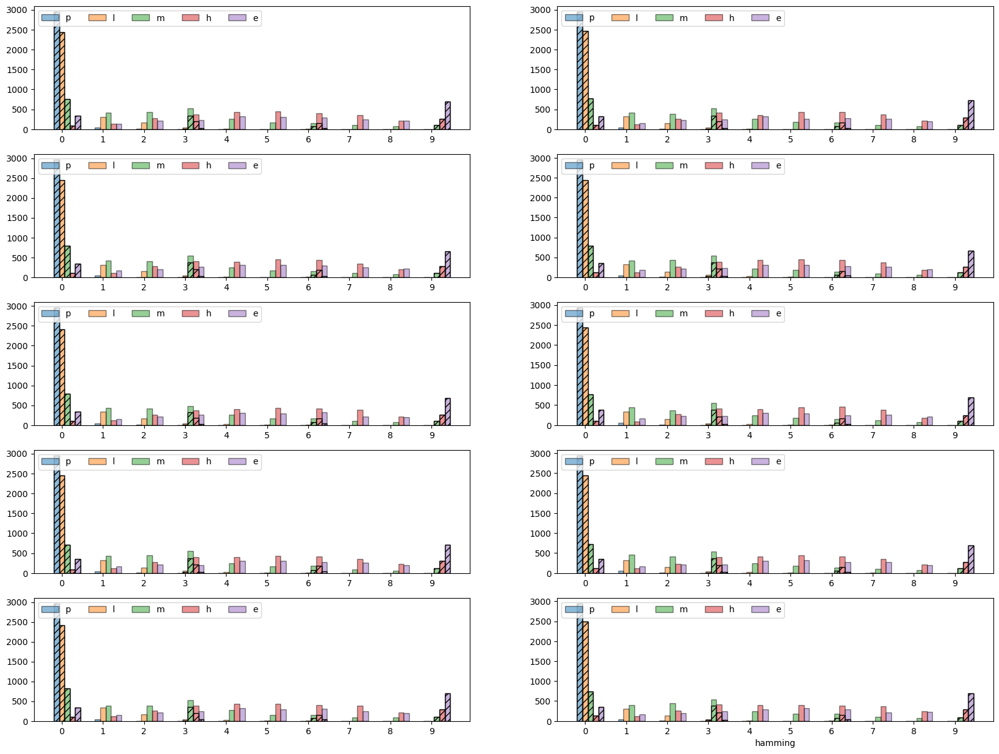

Type : qu-wt2


100%|██████████| 10/10 [00:01<00:00,  6.77it/s]


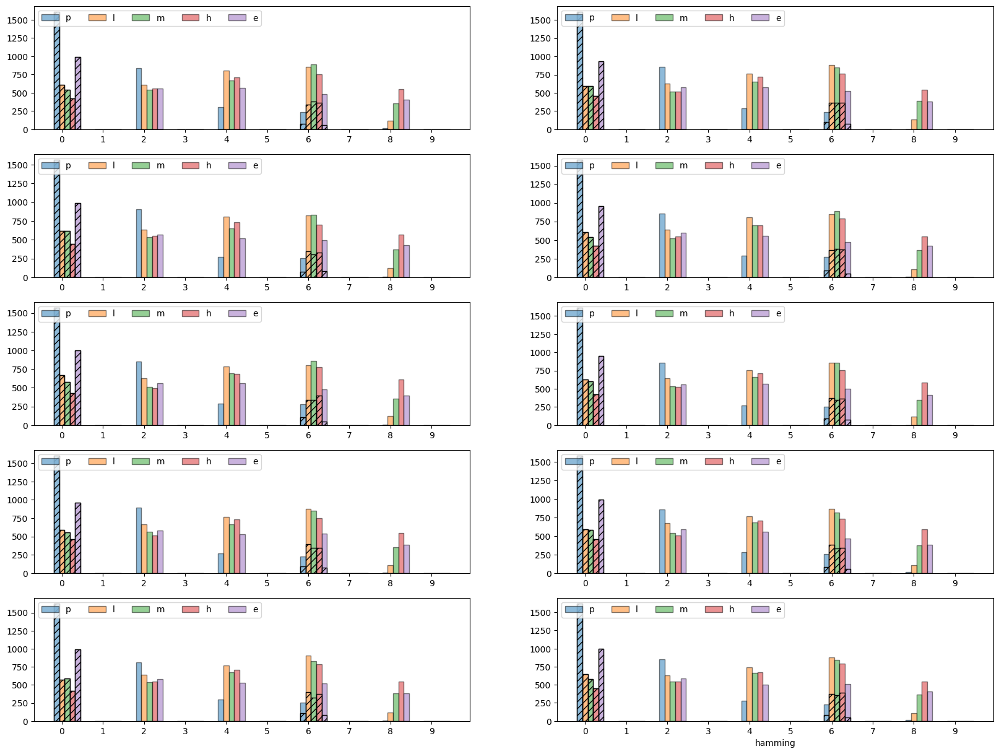

Type : qu-wt3


100%|██████████| 10/10 [00:01<00:00,  6.98it/s]


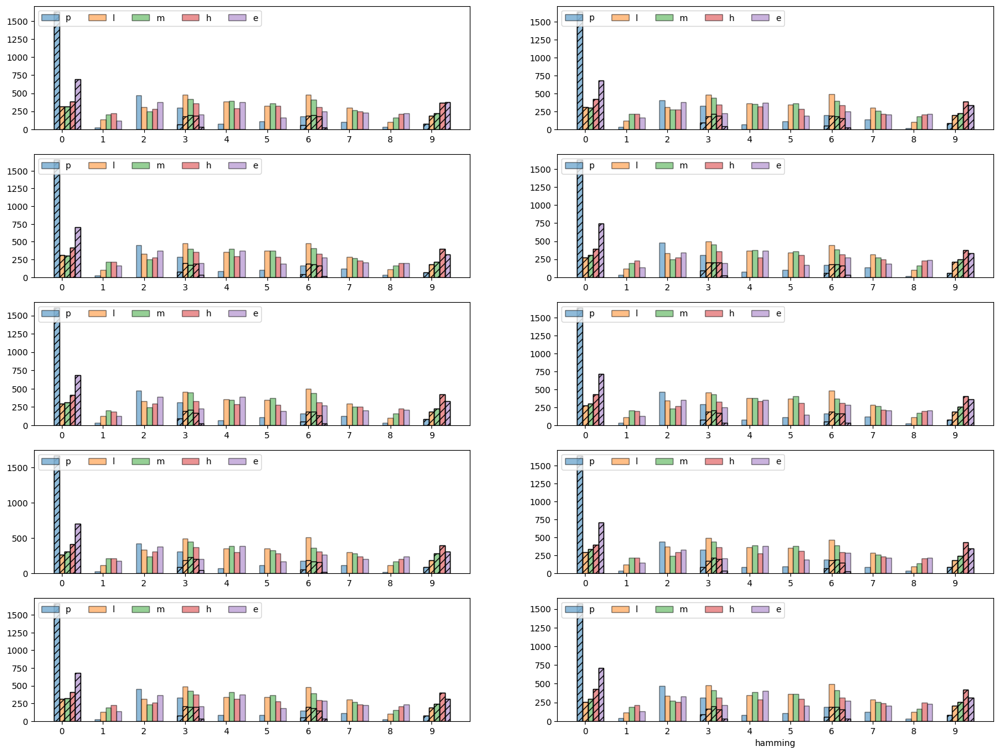

Type : qu-stabilizers-wt3


100%|██████████| 10/10 [00:01<00:00,  7.71it/s]


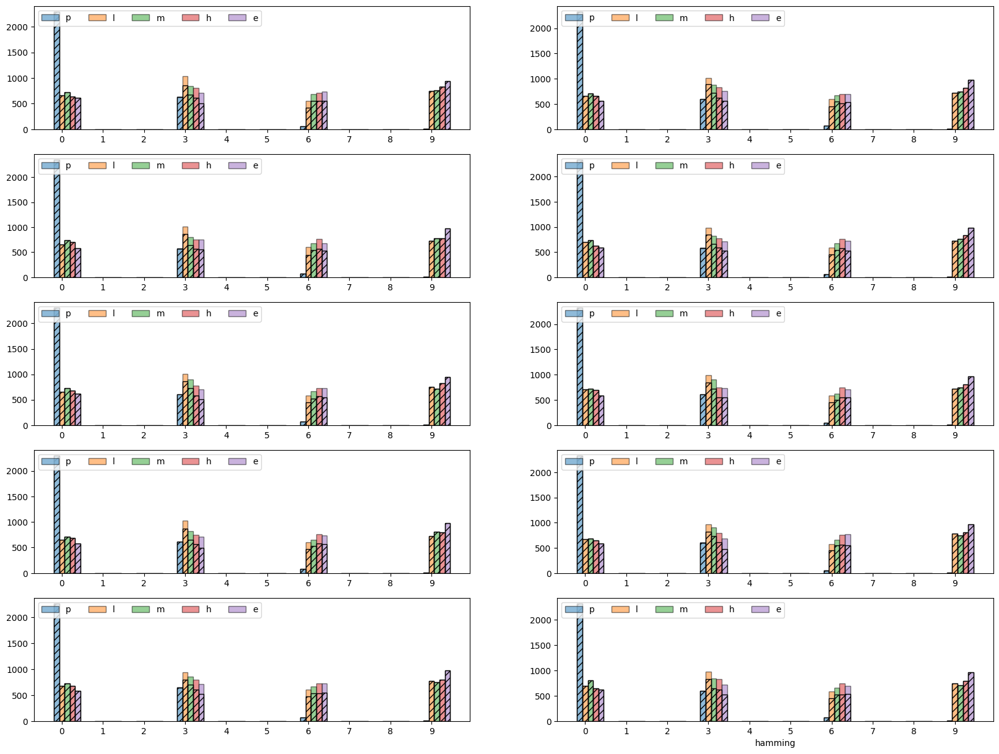

In [208]:
PLOT_MCMC_STATISTICS_HAMMING(tri, figsize= (20,15))